<a href="https://colab.research.google.com/github/Ranaba123/Cancer_Mortality_Status_Predictor/blob/main/w2052777_20221241_S_K_N_Ranaba_Final_Notebook_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## w2052777 - Final Python Notebook 3: : Mortality Status ensemble classifier with its base learners’ performances and Survival Months regression Decision Trees, with their graphical representation and performances.
Author: Sembu Kuttige Nemsara Ranaba

Peer reviewed by : Pyara Perera

# ====================== Regression (Survival Months) ======================


In [ ]:
# importing pandas package
import pandas as pd

In [ ]:
# Loading dataset
dataset = pd.read_csv('/content/drive/MyDrive/Machine Learning/Coursework/w2052777_Preprocesed_Dataset.csv')

In [ ]:
# Exploring the columns of the dataset
list(dataset.columns)

['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Regional_Node_Positive',
 'Survival_Months',
 'Mortality_Status']

In [ ]:
#Print the distinct values of the mortality status
dataset['Mortality_Status'].unique()

array([0, 1])

In [ ]:
# take the dead patients from the dataset
dataset = dataset[dataset['Mortality_Status'] == 1]

In [ ]:
#new dataset shape
dataset.shape

(615, 15)

In [ ]:
dataset.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Regional_Node_Positive,Survival_Months,Mortality_Status
7,40,1,1,0,1,0,2,1,30.0,1,1,9,1,14,1
10,68,1,0,0,0,0,2,1,13.0,1,1,9,1,64,1
40,57,1,2,2,4,0,2,1,70.0,1,1,12,12,42,1
46,42,1,0,2,4,0,2,1,9.0,0,0,15,2,39,1
64,67,1,0,0,0,0,2,1,13.0,1,1,16,3,60,1


In [ ]:
# Declare feature and target variables
X = dataset.drop('Survival_Months', axis=1)  # Input features
y = dataset['Survival_Months']  # Target



In [ ]:
X.columns

Index(['Age', 'Sex', 'T_Stage', 'N_Stage', '6th_Stage', 'Differentiated',
       'Grade', 'A_Stage', 'Tumor_Size', 'Estrogen_Status',
       'Progesterone_Status', 'Regional_Node_Examined',
       'Regional_Node_Positive', 'Mortality_Status'],
      dtype='object')

In [ ]:
# Importing a Python library module and function to allow  to randomly sample  training and test subsets
from sklearn.model_selection import train_test_split

In [ ]:
# samples  dataset into training and test subsets with a ratio
X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.4, random_state=42)

Decission Tree 1

In [ ]:
# The python library which is use to intiate the regression decision tree to the python environment
from sklearn.tree import DecisionTreeRegressor


In [ ]:
#To build a fully grown regression decision tree (DT) model for the  survival months predictions, need  a subset of  original dataset to train the DT regression algorithm
DT_regressor = DecisionTreeRegressor()
DT_regressor.fit(X_train, y_train)


DecisionTreeRegressor()

In [ ]:
#You want to assess how your DT model will perform in the real world, predicting survival months for new patients. It's time to apply your model to make predictions on isolated data
y_pred = DT_regressor.predict(X_test)

In [ ]:
#initiates the required library and uses applies the metrics methods to calculate the regression metrics, then presents their values.
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('R2:', metrics.r2_score(y_test, y_pred))


MAE: 27.524390243902438
MSE: 1191.4349593495936
R2: -1.083027181180249


In [ ]:
# the packages which are need to plot the DT
from sklearn import tree
from matplotlib import pyplot as plt


In [ ]:
#plots the decision tree model for survival months
Tree_figure = plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(DT_regressor, feature_names=list(X_train.columns), filled=True)


In [ ]:
#Save your DT graph as a high-resolution image.
Tree_figure.savefig("/content/drive/MyDrive/Machine Learning/Coursework/decistion_tree.svg")

Decission Tree 2

In [ ]:
pruned_DT_regressor = DecisionTreeRegressor(max_depth=4)
pruned_DT_regressor.fit(X_train, y_train)
y_pred_pruned_DT_regressor= pruned_DT_regressor.predict(X_test)


In [ ]:
print('Pruned MAE:', metrics.mean_absolute_error(y_test, y_pred_pruned_DT_regressor))
print('Pruned MSE:', metrics.mean_squared_error(y_test, y_pred_pruned_DT_regressor))
print('Pruned R2:', metrics.r2_score(y_test, y_pred_pruned_DT_regressor))

Pruned MAE: 19.473850181650207
Pruned MSE: 591.1588646608212
Pruned R2: -0.03354360539862822


In [ ]:
#plots the decision tree model for survival months
Tree_figure_prunned= plt.figure(figsize=(200,200))
DT_Graph = tree.plot_tree(pruned_DT_regressor, feature_names=list(X_train.columns), filled=True)

# ====================== Eenseble Classifier(Mortality Status) ======================


In [ ]:
# Loading the dataset
data = pd.read_csv('/content/drive/MyDrive/Machine Learning/Coursework/w2052777_Preprocesed_Dataset.csv')

In [ ]:
# display some values in the dataset
data.head()

,Age,Sex,T_Stage,N_Stage,6th_Stage,Differentiated,Grade,A_Stage,Tumor_Size,Estrogen_Status,Progesterone_Status,Regional_Node_Examined,Regional_Node_Positive,Survival_Months,Mortality_Status
0,68,1,0,0,0,1,3,1,4.0,1,1,24,1,60,0
1,50,1,1,1,2,0,2,1,35.0,1,1,14,5,62,0
2,58,1,2,2,4,0,2,1,63.0,1,1,14,7,75,0
3,58,1,0,0,0,1,3,1,18.0,1,1,2,1,84,0
4,47,1,1,0,1,1,3,1,41.0,1,1,3,1,50,0


In [ ]:
# Understand the dataset variable data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4017 entries, 0 to 4016
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4017 non-null   int64  
 1   Sex                     4017 non-null   int64  
 2   T_Stage                 4017 non-null   int64  
 3   N_Stage                 4017 non-null   int64  
 4   6th_Stage               4017 non-null   int64  
 5   Differentiated          4017 non-null   int64  
 6   Grade                   4017 non-null   int64  
 7   A_Stage                 4017 non-null   int64  
 8   Tumor_Size              4017 non-null   float64
 9   Estrogen_Status         4017 non-null   int64  
 10  Progesterone_Status     4017 non-null   int64  
 11  Regional_Node_Examined  4017 non-null   int64  
 12  Regional_Node_Positive  4017 non-null   int64  
 13  Survival_Months         4017 non-null   int64  
 14  Mortality_Status        4017 non-null   

In [ ]:
list(data.columns)

['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Regional_Node_Positive',
 'Survival_Months',
 'Mortality_Status']

In [ ]:
# Declare feature and target variables
feature_cols = ['Age',
 'Sex',
 'T_Stage',
 'N_Stage',
 '6th_Stage',
 'Differentiated',
 'Grade',
 'A_Stage',
 'Tumor_Size',
 'Estrogen_Status',
 'Progesterone_Status',
 'Regional_Node_Examined',
 'Regional_Node_Positive']
X_class = data[feature_cols] # Features
y_class = data['Mortality_Status'] # Target variable


In [ ]:
# Importing a Python library module and function to allow  to randomly sample  training and test subsets

from sklearn.model_selection import train_test_split

In [ ]:
# samples  dataset into training and test subsets with a ratio
X_train_class,X_test_class,y_train_class,y_test_class = train_test_split(X_class,y_class,test_size=0.2, random_state=42, stratify=y_class)

In [ ]:
#library to initiate the Logistic Regression modelling algorithm
from sklearn.linear_model import LogisticRegression
# Initialize the Logistic Regression model with increased max_iter for convergence
logreg = LogisticRegression()
# function that estimates logreg algorithm learnable parameters using the desired sampled dataset.
logreg.fit(X_train_class, y_train_class)






/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

              precision    recall  f1-score   support

           0       0.86      0.98      0.92       681
           1       0.60      0.15      0.24       123

    accuracy                           0.85       804
   macro avg       0.73      0.56      0.58       804
weighted avg       0.82      0.85      0.81       804



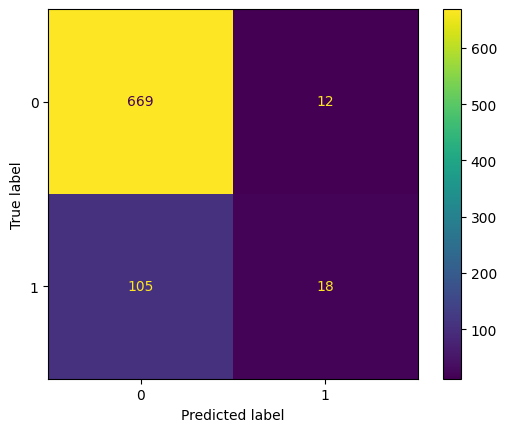

In [ ]:
# Predictions
y_pred_train = logreg.predict(X_train_class)
y_pred = logreg.predict(X_test_class)

# initiates the required library and function, then calculates and presents your desired confusion matrix only.
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

logistic_regression_confusion_matrix = confusion_matrix(y_test_class, y_pred, labels=logreg.classes_)

disp = ConfusionMatrixDisplay(logistic_regression_confusion_matrix, display_labels=logreg.classes_)
disp.plot()

#Python code block that initiates the required library and function for the report the display this report.
from sklearn.metrics import classification_report
print(classification_report(y_test_class, y_pred))




In [ ]:
# initiate a machine learning library and the Naive Bayes modelling algorithm
#train it with  training data subset
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(X_train_class, y_train_class)

GaussianNB()

In [ ]:
# a Python machine-learning library to initiate the Voting Ensemble Classifier method in the modelling environment
from sklearn.ensemble import VotingClassifier

In [ ]:
#declare the list of the base_learners and leverage them to be used by the Voting Classifier
base_learners = [
    ('Logistic Regression', logreg),
    ('Naive bayes', nb)
]
ensemble_learner = VotingClassifier(estimators=base_learners, voting='soft') # Assign base_learners to the estimators parameter

In [ ]:
#trains the voting ensemble algorithm using the desired dataset subset.
ensemble_learner.fit(X_train_class, y_train_class)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


VotingClassifier(estimators=[('Logistic Regression', LogisticRegression()),
                             ('Naive bayes', GaussianNB())],
                 voting='soft')

In [ ]:
# apply the model for predictions
y_pred_ensemble_learner = ensemble_learner.predict(X_test_class)

In [ ]:
#initiates the required library, class and method then calculates and presents the accuracy score only the ensemble voting classifier
from sklearn.metrics import accuracy_score
ensemble_learner_accuracy = accuracy_score(y_test_class, y_pred_ensemble_learner)

print ("The voting ensemble classifier accuracy is: ", ensemble_learner_accuracy)


The voting ensemble classifier accuracy is:  0.7985074626865671


Text(0.5, 1.0, 'Ensemble Learner Confusion Matrix')

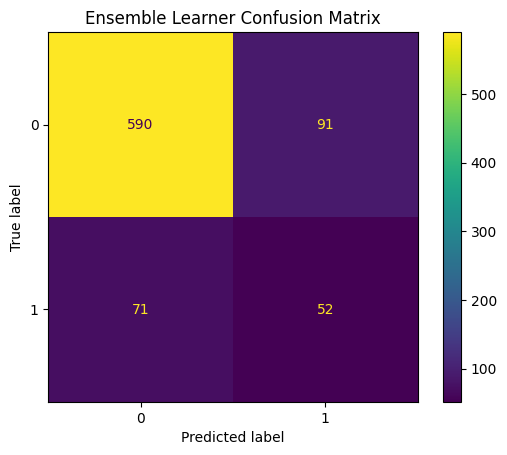

In [ ]:
#initiates the required library, class and method then calculates and presents the desired confusion matrix only.
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

ensemble_learner_cm_test = confusion_matrix(y_test_class, y_pred_ensemble_learner, labels=ensemble_learner.classes_)

ensemble_learner_disp = ConfusionMatrixDisplay(ensemble_learner_cm_test,display_labels=ensemble_learner.classes_)

ensemble_learner_disp.plot()

ensemble_learner_disp.ax_.set_title("Ensemble Learner Confusion Matrix")


In [ ]:
#initiates the required library, class and function for this report then displays it.
from sklearn.metrics import classification_report

print("Ensemble Learner Classification Report \n", classification_report(y_test_class, y_pred_ensemble_learner))


Ensemble Learner Classification Report 
               precision    recall  f1-score   support

           0       0.89      0.87      0.88       681
           1       0.36      0.42      0.39       123

    accuracy                           0.80       804
   macro avg       0.63      0.64      0.64       804
weighted avg       0.81      0.80      0.80       804



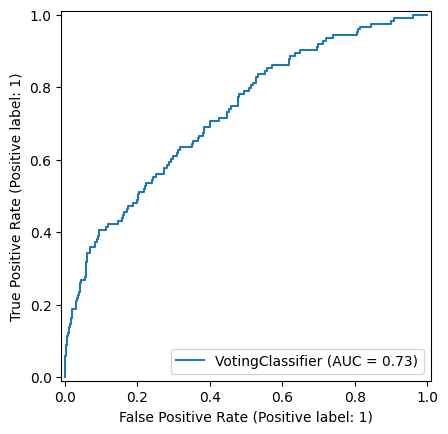

In [ ]:
#that initiates the required library and function, then display this AUC-ROC.
from sklearn.metrics import RocCurveDisplay

ensemble_learner = RocCurveDisplay.from_estimator(ensemble_learner, X_test_class, y_test_class)
